
# A Low Poly Art Tutorial in Python



So this is the goal for this tutorial - to turn a beautiful wallpaper (or three) into beautiful low poly art.

In [5]:
import matplotlib.pyplot as plt
plt.style.use("default")
plt.rcParams['figure.figsize'] = (11, 4)
plt.rcParams['figure.dpi'] = 200
plt.rcParams["axes.labelsize"] = 12
plt.rcParams["ytick.labelsize"] = 12
plt.rcParams["xtick.labelsize"] = 12
plt.rcParams["font.size"] = 12
plt.rcParams["image.cmap"] = "magma"
plt.rcParams["figure.subplot.wspace"] = 0.05
plt.rc('text', usetex=False)
plt.rc('font', family='sans-serif')

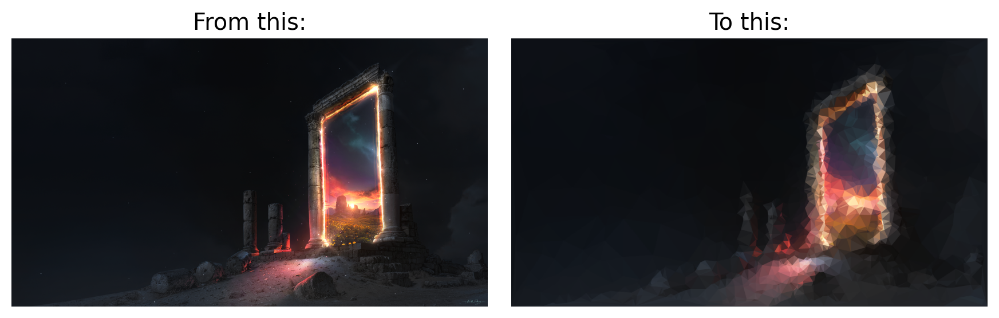

In [6]:
from IPython.display import Video
from IPython.display import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams

# read images
img_A = mpimg.imread('bg1.png')
img_B = mpimg.imread('bg1_final.png')

# display images
fig, axes = plt.subplots(ncols=2)
axes[0].imshow(img_A);
axes[1].imshow(img_B);
axes[0].axis('off');
axes[1].axis('off');
axes[0].set_title("From this:");
axes[1].set_title("To this:");


The approach we are going to take to get to this is fairly simple.

1. Load our image in
2. Manipulate the image to highlight edges and areas of detail
3. Draw potential vertices from those areas
4. Calculate triangles from vertices
5. Determine the colour of the triangles
6. Plot the image

Lets get our imports out of the way and then power through each section:

In [7]:
import os
import numpy as np
import pygame
import pygame.gfxdraw
import matplotlib.pyplot as plt
from scipy.spatial import Delaunay
from scipy.ndimage import gaussian_filter
from collections import defaultdict

pygame 2.0.1 (SDL 2.0.14, Python 3.8.5)
Hello from the pygame community. https://www.pygame.org/contribute.html


## 1. Load in Our Image

First step is to get the image into memory. We'll use pygame to load this into an array (`matplotlib` could also do this). And then I want to turn the image to grayscale so we can work with 2D and not 3D data. However, human eyes are not equally sensitive to all colours, so we don't want a standard mean of the red, green, and blue components. Looking at the [Wikipedia page for Luma](https://en.wikipedia.org/wiki/Luma_(video)), there are a few options, but I'm going to pick the first one on the page which states that:

$$ Y = 0.2126R + 0.7152G + 0.0722B $$

Who know that blue counted for so little? In the first run through I'm going to use an image of a portal which has a very distinct area of detail and a larger area of lower detail to highlight what we're doing. Then at the very end I'll run the code for other images too and see what we get!


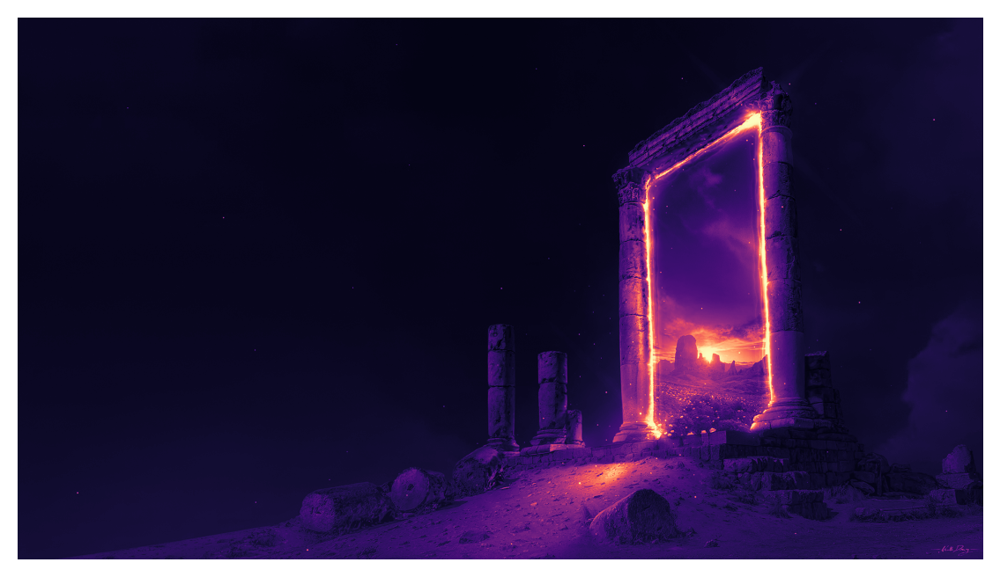

In [8]:
inp = pygame.surfarray.pixels3d(pygame.image.load("bg1.png"))
perceptual_weight = np.array([0.2126, 0.7152, 0.0722])
grayscale = (inp * perceptual_weight).sum(axis=-1)
plt.imshow(grayscale.T);
plt.axis("off"); ###REMOVE

## 2. Highlight details

Great, our image is now nice and flat. We *could* use this if we wanted to sample points according to how luminous the image is. Let's not do that. First, I don't care about tiny features, I want the low poly art to follow the broad structure, so I want to blur the image a tiny bit.

On top of that, an easy way to find area of interest (ie areas that change) is to blur the image even more and take the difference. This is actually effectively how a sharpen filter works (by adding the diffence onto the original image). The `sqrt` here is to make sure we get _something_ in the black outside

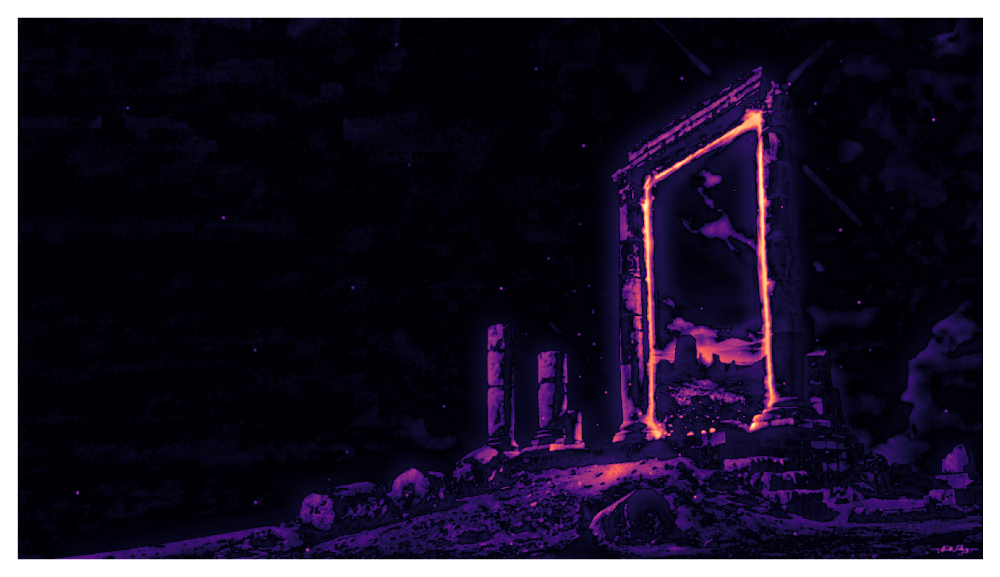

In [9]:
x = gaussian_filter(grayscale, 2, mode="reflect")
x2 = gaussian_filter(grayscale, 30, mode="reflect")

# Take the difference, deweight negatives, normalise
diff = (x - x2)
diff[diff < 0] *= 0.1
diff = np.sqrt(np.abs(diff) / diff.max())

plt.imshow(diff.T)
plt.axis("off"); ###REMOVE

## 3. Vertices from image

So now lets get samples of points from the image above. To do this, we'll use [rejection sampling](rejection_sampling), which means we pick a random $x, y$ coordinate and accept or reject it based upon whether a random uniform number is below the luminosity at that point. So the higher the luminosity, the greater the chance to accept it. We'll also generate a buttload of points to start with and just take what we need from that list.

So here is a nice function which takes a reference image and returns sample points and their value:

In [11]:
def sample(ref, n=1000000):
    np.random.seed(0)
    w, h = x.shape
    xs = np.random.randint(0, w, size=n)
    ys = np.random.randint(0, h, size=n)
    value = ref[xs, ys]
    accept = np.random.random(size=n) < value
    points = np.array([xs[accept], ys[accept]])
    return points.T, value[accept]

Let's plot these points to see if they look nicely distributed:

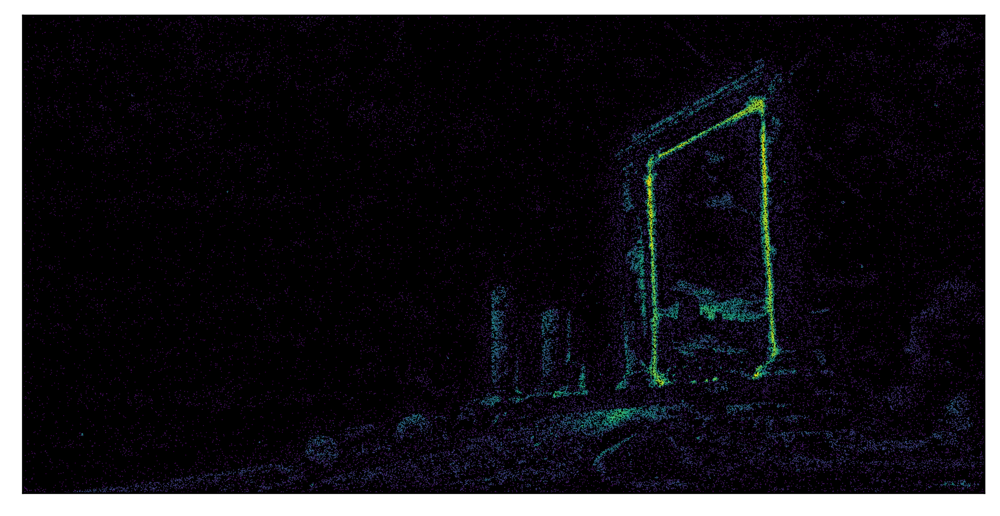

In [29]:
samples, v = sample(diff)
plt.scatter(samples[:, 0], -samples[:, 1], c=v, s=0.2, edgecolors="none", cmap="viridis")
plt.gca().set_facecolor("k"), plt.margins(0); ###REMOVE
plt.gca().axes.yaxis.set_visible(False); ###REMOVE
plt.gca().axes.xaxis.set_visible(False); ###REMOVE

Looks good to me! The gate should have a good level of detail, and the background sky should have far less.

## 4. Triangles from vertices

This is actually super simple, because `scipy` has done it all for us. We'll simply use `Delaunay` triangulation, which you can read more about [here](https://en.wikipedia.org/wiki/Delaunay_triangulation). The TL;DR is that Delaunay triangular is a way of drawing triangles between verticies, such that no external points lie within each triangles circumcircle. This great example comes from Wikipedia:

Here the left does **not** represent a Delaunay triangulation of the polygon, because a circumcirle drawn from the left hand triangle (the big red circle) encapsulates a vertex that is not part of the triangle. The right hand triangulation is satisfies this, as the circumcircle from each of the two triangles only includes the vertices from that triangle.

## 5. Colour from triangles

The algorithm is simple. We assign each pixel to a triangle, and then take all the pixels in a triangle and average the colour. Simple... but incredibly slow.

In [33]:
def get_colour_of_tri(tri, image):
    colours = defaultdict(lambda: [])
    w, h, _ = image.shape
    for i in range(0, w):
        for j in range(0, h):
            # Gets the index of the triangle the point is in
            index = tri.find_simplex((i, j))
            colours[int(index)].append(inp[i, j, :])
    # For each triangle, find the average colour
    for index, array in colours.items():
        colours[index] = np.array(array).mean(axis=0)
    return colours

## 6. Plot the image

This function is pretty simple too. We take a screen, and then for each triangle, we use `pygame.gfxdraw` for anti-aliased drawing. I'm plotting the outline and the fill both to try and make sure there are no black gaps between images (but I'm unsure if this actually makes a difference).

In [18]:
def draw(tri, colours, screen, upscale):
    s = screen.copy()
    for key, c in colours.items():
        t = tri.points[tri.simplices[key]]
        pygame.gfxdraw.filled_polygon(s, t * upscale, c)
        pygame.gfxdraw.polygon(s, t * upscale, c)
    return s

## The animation drawing loop

So heres the main flow of the script. We create a base screen and some start vertices as the four corners of the image. Then we jump into a for loop, get vertices and then triangles, determine the colours and plot the image. Notice I have an upscale factor of 2 here so I can shrink it down at the end for better anti-aliasing then the `gfxdraw` methods.

In [ ]:
w, h, _ = inp.shape
upscale = 2
screen = pygame.Surface((w * upscale, h * upscale))
screen.fill(inp.mean(axis=(0, 1)))
corners = np.array([(0, 0), (0, h - 1), (w - 1, 0), (w - 1, h - 1)])
points = np.concatenate((corners, samples))

outdir = "output/"
os.makedirs(outdir, exist_ok=True)

for i in range(0, 100):
    n = 5 + i + 2 * int(i**2)
    tri = Delaunay(points[:n, :])
    colours = get_colour_of_tri(tri, inp)
    s = draw(tri, colours, screen, upscale)
    s = pygame.transform.smoothscale(s, (w, h))
    pygame.image.save(s, f"output/{i:04d}.png")

Running this will output a ton of images in the output folder, and we can pick one with the right level of detail as a final image, and we can use `ffmpeg` to turn those images into an animation.

In [386]:
import subprocess
def make(d, o):
    command = f"ffmpeg -r 5 -i {d}%04d.png -vcodec libx264 -y -filter_complex \"tpad=stop_duration=3:stop_mode=clone\" -crf 23 -movflags faststart -pix_fmt yuv420p {o}" ###REMOVE
    subprocess.run(command);
    
outdir = "output/"
output = "final1.mp4"
make(outdir, output)

In [9]:
Video("final1.mp4")

I ended up liking a frame somewhere in the middle as the "best", and here is a direct comparison, not just for the example image, but for others as well:

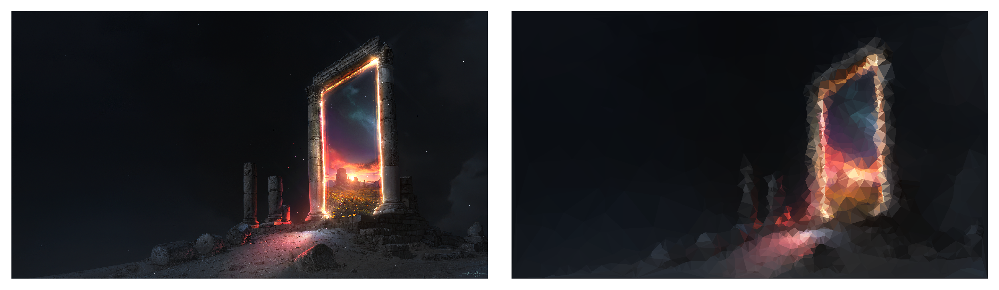

In [45]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams

# read images
img_A = mpimg.imread('lowpoly/bg1.png')
img_B = mpimg.imread('lowpoly/bg1_final.png')

# display images
fig, axes = plt.subplots(ncols=2)
axes[0].imshow(img_A);
axes[1].imshow(img_B);
axes[0].axis('off');
axes[1].axis('off');